# Part I - (Dataset Exploration Title)
## by Christopher Hu

## Introduction
> This document explores a dataset that contains 113,937 loans with 81 variables on each loan. including loan amount, borrower rate (or interest rate), current loan status, borrow income, income range, borrower state, Employment Status, loan amount etc.


## Preliminary Wrangling


In [1]:
# import all packages and set plots to be embedded inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
# low code for Data Visualization from plotly
import plotly.express as px

%matplotlib inline
# Permanently changes the pandas settings, so that I can see all the columns displayed
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)

> Load in my dataset

In [2]:
# Load All the data
propertyLoan = pd.read_csv("prosperLoanData.csv")

In [3]:
# high level overview of the property loan data
print(propertyLoan.shape)
print(propertyLoan.info())

(113937, 81)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113937 entries, 0 to 113936
Data columns (total 81 columns):
 #   Column                               Non-Null Count   Dtype  
---  ------                               --------------   -----  
 0   ListingKey                           113937 non-null  object 
 1   ListingNumber                        113937 non-null  int64  
 2   ListingCreationDate                  113937 non-null  object 
 3   CreditGrade                          28953 non-null   object 
 4   Term                                 113937 non-null  int64  
 5   LoanStatus                           113937 non-null  object 
 6   ClosedDate                           55089 non-null   object 
 7   BorrowerAPR                          113912 non-null  float64
 8   BorrowerRate                         113937 non-null  float64
 9   LenderYield                          113937 non-null  float64
 10  EstimatedEffectiveYield              84853 non-null   float64
 11  

### What is the structure of my dataset?

> **Step1**: There are 113,937 loans in this dataset and each loan has 81 columns, namely loan amount, borrower rate (or interest rate), current loan status, borrower income, etc.   Some of the columns such as **CreditGrade, ClosedDate, TotalProsperLoan, TotalProsperPaymentsBilled, OnTimeProsperPayments, ProsperPaymentsLessThanOneMonthLate, ProsperPaymentsOneMonthPlusLate, ProsperPrincipalBorrowed, ProsperPrincipalOutstanding, ScorexChangeAtTimeOfListing, LoanFirstDefaultedCycleNumber** have majority of the values are null.  A quick glance of the original 113937 dataset revealed that the dataset can be split into two major timeframe:  pre-7/2009 and after-7/2009. The latter contain 84853 records while the former (pre 7/2009) contains 29084 loans.  I therefore chose the subset of after-7/2009 with a  total of 84853 records

> **Step2**: In this step, I need to first fixed the column names with spaces and then convert some of the object columns into categorical columns, e.g. LoanStatus, BorrowState, Occupation, EmploymentStatus, IncomeRange.   I also converted LoanOriginationDate to datetime type and extract "year" value to LoanOriginationYear for later use.


### What is/are the main feature(s) of interest in my dataset?

> I am most interested in figuring out what feature or features can best predicting the loan with defaulted and/or chargedoff status

### What features in the dataset do you think will help support your investigation into your feature(s) of interest?

> I think Occupation, EmploymentStatus, EmploymentStatusDuration, CreditScore, IncomeRange, BorrowerRate, ProsperScore etc will help support my investigation into loan with defaulted and chargedoff status

> **Step3**: Since I am not research each individual loan, therefore I will drop some columns such as ListingKey, ListingNumber, ListingCreationDate, CreditGrade (0 records), ClosedDate, GroupKey, LoanKey, LoanNumber, LoanOriginationQuarter, MemberKey from the dataframe 

### Step1: split dataset into two different subset  - pre-072009 and after-072009

In [4]:
# pre-7/2009 dataset
propertyLoan_pre072009 = propertyLoan[propertyLoan['ProsperScore'].isnull()]

In [5]:
propertyLoan_pre072009.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29084 entries, 0 to 113927
Data columns (total 81 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   ListingKey                           29084 non-null  object 
 1   ListingNumber                        29084 non-null  int64  
 2   ListingCreationDate                  29084 non-null  object 
 3   CreditGrade                          28953 non-null  object 
 4   Term                                 29084 non-null  int64  
 5   LoanStatus                           29084 non-null  object 
 6   ClosedDate                           29084 non-null  object 
 7   BorrowerAPR                          29059 non-null  float64
 8   BorrowerRate                         29084 non-null  float64
 9   LenderYield                          29084 non-null  float64
 10  EstimatedEffectiveYield              0 non-null      float64
 11  EstimatedLoss              

In [6]:
# only analyse the data after July 2009 that with ProsperRating (or ProsperScore) value
propertyLoan_072009 = propertyLoan[~propertyLoan['ProsperScore'].isnull()]

In [7]:
propertyLoan_072009.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 84853 entries, 1 to 113936
Data columns (total 81 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   ListingKey                           84853 non-null  object 
 1   ListingNumber                        84853 non-null  int64  
 2   ListingCreationDate                  84853 non-null  object 
 3   CreditGrade                          0 non-null      object 
 4   Term                                 84853 non-null  int64  
 5   LoanStatus                           84853 non-null  object 
 6   ClosedDate                           26005 non-null  object 
 7   BorrowerAPR                          84853 non-null  float64
 8   BorrowerRate                         84853 non-null  float64
 9   LenderYield                          84853 non-null  float64
 10  EstimatedEffectiveYield              84853 non-null  float64
 11  EstimatedLoss              

### Step 2 - Fix column name with space and convert certain object columns into categorical data type

In [8]:
# fix the column name that has space: 
# ProsperRating (numeric), ProsperRating (Alpha), ListingCategory (numeric), TradesNeverDelinquent (percentage)
propertyLoan_072009.rename(columns={"ProsperRating (numeric)":"ProsperRating_numeric"}, inplace=True)
propertyLoan_072009.rename(columns={"ProsperRating (Alpha)":"ProsperRating_Alpha"}, inplace=True)
propertyLoan_072009.rename(columns={"ListingCategory (numeric)":"ListingCategory_numeric"}, inplace=True)
propertyLoan_072009.rename(columns={"TradesNeverDelinquent (percentage)":"TradesNeverDelinquent_percentage"}, inplace=True)

C:\Users\christopher.hu\AppData\Local\Temp\ipykernel_21532\1143639912.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  propertyLoan_072009.rename(columns={"ProsperRating (numeric)":"ProsperRating_numeric"}, inplace=True)
C:\Users\christopher.hu\AppData\Local\Temp\ipykernel_21532\1143639912.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  propertyLoan_072009.rename(columns={"ProsperRating (Alpha)":"ProsperRating_Alpha"}, inplace=True)
C:\Users\christopher.hu\AppData\Local\Temp\ipykernel_21532\1143639912.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveat

In [9]:
# covert the identified object variables into ordered categorical types
# LoanStatus, EmploymentStatus, IncomeRange, ProsperRating_Alpha
ordinal_var_dict = {#'LoanStatus':['Completed', 'Current', 'Past Due (1-15 days)', 
                    #              'Past Due (16-30 days)', 'Past Due (31-60 days)', 
                    #              'Past Due (61-90 days)', 'Past Due (91-120 days)', 
                    #              'Past Due (>120 days)', 'Chargedoff', 'Defaulted', 
                    #              'FinalPaymentInProgress', 'Cancelled'],
                   'EmploymentStatus':['Employed', 'Full-time', 'Self-employed', 'Part-time',  
                                       'Not employed', 'Retired', 'Other', 'Not available'],
                   'IncomeRange':['$100,000+', '$75,000-99,999', '$50,000-74,999', '$25,000-49,999', 
                                  '$1-24,999', '$0', 'Not displayed', 'Not employed'],
                   'ProsperRating_Alpha':['AA', 'A', 'B', 'C', 'D', 'E', 'HR']}
                   #'IsBorrowerHomeowner':[False, True],
                   #'CurrentlyInGroup':[False, True],
                   #'IncomeVerifiable':[False, True]}

for var in ordinal_var_dict:
    ordered_var = pd.api.types.CategoricalDtype(ordered = True,
                                               categories = ordinal_var_dict[var])
    propertyLoan_072009[var] = propertyLoan_072009[var].astype(ordered_var)

C:\Users\christopher.hu\AppData\Local\Temp\ipykernel_21532\2953509810.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  propertyLoan_072009[var] = propertyLoan_072009[var].astype(ordered_var)
C:\Users\christopher.hu\AppData\Local\Temp\ipykernel_21532\2953509810.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  propertyLoan_072009[var] = propertyLoan_072009[var].astype(ordered_var)
C:\Users\christopher.hu\AppData\Local\Temp\ipykernel_21532\2953509810.py:20: SettingWithCopyWarning: 
A value is trying to

In [10]:
# Convert LoanOriginationDate to datetime type and add a year column to the dataframe
propertyLoan_072009.LoanOriginationDate = pd.to_datetime(propertyLoan_072009.LoanOriginationDate)
# add an additional column: LoanOriginationYear
propertyLoan_072009['LoanOriginationYear'] = propertyLoan_072009.LoanOriginationDate.dt.year


C:\Users\christopher.hu\AppData\Local\Temp\ipykernel_21532\1392247816.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  propertyLoan_072009.LoanOriginationDate = pd.to_datetime(propertyLoan_072009.LoanOriginationDate)
C:\Users\christopher.hu\AppData\Local\Temp\ipykernel_21532\1392247816.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  propertyLoan_072009['LoanOriginationYear'] = propertyLoan_072009.LoanOriginationDate.dt.year


### Step 3 - Drop Some of the individual loan related columns

In [11]:
# The following columns will be dropped  
propertyLoan_072009.drop(columns=['ListingKey', 'ListingNumber', 'ListingCreationDate', 'CreditGrade', 'ClosedDate', 
                                  'GroupKey', 'LoanKey', 'LoanNumber', 'LoanOriginationQuarter', 'MemberKey'], inplace=True)



C:\Users\christopher.hu\AppData\Local\Temp\ipykernel_21532\948620059.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  propertyLoan_072009.drop(columns=['ListingKey', 'ListingNumber', 'ListingCreationDate', 'CreditGrade', 'ClosedDate',


In [12]:
propertyLoan_072009.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 84853 entries, 1 to 113936
Data columns (total 72 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   Term                                 84853 non-null  int64         
 1   LoanStatus                           84853 non-null  object        
 2   BorrowerAPR                          84853 non-null  float64       
 3   BorrowerRate                         84853 non-null  float64       
 4   LenderYield                          84853 non-null  float64       
 5   EstimatedEffectiveYield              84853 non-null  float64       
 6   EstimatedLoss                        84853 non-null  float64       
 7   EstimatedReturn                      84853 non-null  float64       
 8   ProsperRating_numeric                84853 non-null  float64       
 9   ProsperRating_Alpha                  84853 non-null  category      
 10  ProsperSc

In [13]:
# reset index for the subset data propertyLoan_072009
propertyLoan_072009 = propertyLoan_072009.reset_index()

In [14]:
# descriptive stats for numeric variables the dataset for further analysis
print(propertyLoan_072009.describe())

               index          Term   BorrowerAPR  BorrowerRate   LenderYield  \
count   84853.000000  84853.000000  84853.000000  84853.000000  84853.000000   
mean    56958.246850     42.486135      0.226658      0.196022      0.186017   
std     32885.220638     11.640346      0.079916      0.074631      0.074631   
min         1.000000     12.000000      0.045830      0.040000      0.030000   
25%     28507.000000     36.000000      0.163280      0.135900      0.125900   
50%     56960.000000     36.000000      0.219450      0.187500      0.177500   
75%     85420.000000     60.000000      0.292540      0.257400      0.247400   
max    113936.000000     60.000000      0.423950      0.360000      0.340000   

       EstimatedEffectiveYield  EstimatedLoss  EstimatedReturn  \
count             84853.000000   84853.000000     84853.000000   
mean                  0.168661       0.080306         0.096068   
std                   0.068467       0.046764         0.030403   
min            

## Before Univariate Exploration, I would like have an overview of column-column correlation, histogram of each numberic columns to look for patterns

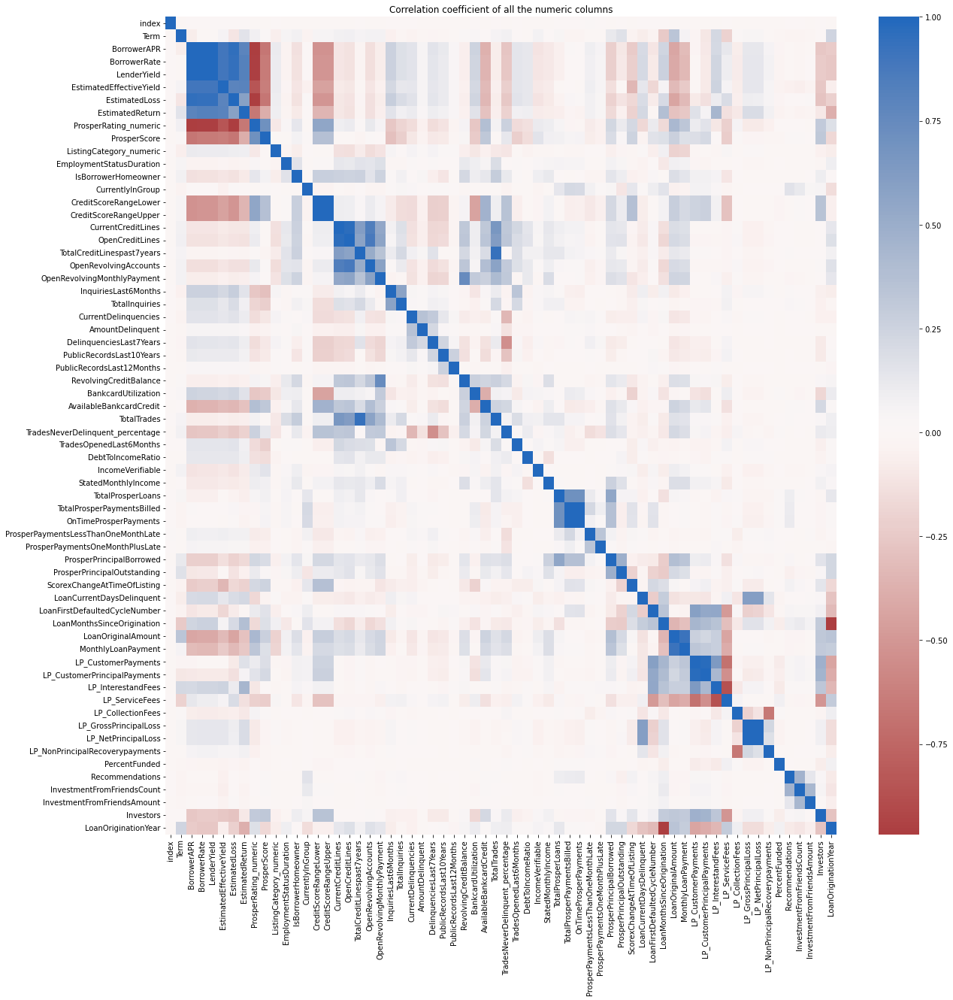

In [15]:
# find the corr of all the numeric columns
# corr = propertyLoan_072009.corr()
# correlation heatmap 
plt.figure(figsize=[20,20])
sb.heatmap(propertyLoan_072009.corr(), annot=False, fmt='.2f',
          cmap='vlag_r', center=0);
plt.title("Correlation coefficient of all the numeric columns");

This correlation coefficient heatmap indicated that very few of the variables are linearly correlated.  Only few parameter are linearly correlated well (has correlation coefficient > 0.8 (or <-0.8) 

In [16]:
# I also use plotly to view the above heatmap
#corr heatmap by plotly
fig = px.imshow(propertyLoan_072009.corr(), text_auto=True, width=1600, height=900)
fig.update_layout(title_text='Correlation coefficient of all the numeric columns by plotly')
fig.show()

Heatmap from plotly is somewhat more convenient for user to zoom in to see more details. I can choose those numeric variables that produced good corr (close to 1 and -1).  The following columns are picked for further study 
> **LoanOriginalAmount, 'CurrentDelinquencies', BorrowerRate, LenderYield, EstimatedLoss, EstimatedReturn, ProsperRating_numeric, ProsperScore, CreditScoreRangeLower, OpenCreditLines, CurrentCreditLines, TotalTrades, TotalCreditLinespast7years, DelinquenciesLast7Years, StatedMonthlyIncome, TradesNeverDelinquent_percentage, TotalProsperPaymentsBilled, OnTimeProsperPayments, TotalProsperLoans, LP_ServiceFees, LP_InterestandFees, LP_NetPrincipalLoss, LoanCurrentDaysDelinquent**

In [17]:
# define a smaller list of numeric variables to investigate based on above observation
numeric_vars = ['LoanOriginalAmount', 'CurrentDelinquencies', 'BorrowerRate', 'LenderYield', 'EstimatedLoss', 
                'EstimatedReturn', 'ProsperRating_numeric', 'ProsperScore', 'CreditScoreRangeLower', 'OpenCreditLines', 
                'CurrentCreditLines', 'TotalTrades', 'TotalCreditLinespast7years', 'DelinquenciesLast7Years', 
                'StatedMonthlyIncome', 'TradesNeverDelinquent_percentage', 'TotalProsperPaymentsBilled', 
                'OnTimeProsperPayments', 'TotalProsperLoans', 'LP_ServiceFees', 'LP_InterestandFees', 
                'LP_NetPrincipalLoss', 'LoanCurrentDaysDelinquent']

# group all ordered factor in a list
categoric_vars = ['LoanStatus', 'EmploymentStatus', 'IncomeRange', 'ProsperRating_Alpha','IsBorrowerHomeowner',
                 'CurrentlyInGroup', 'IncomeVerifiable']
norminal_vars = ['ListingCategory', 'BorrowerState', 'Occupation', 'CreditScoreRangeLower', 'year']

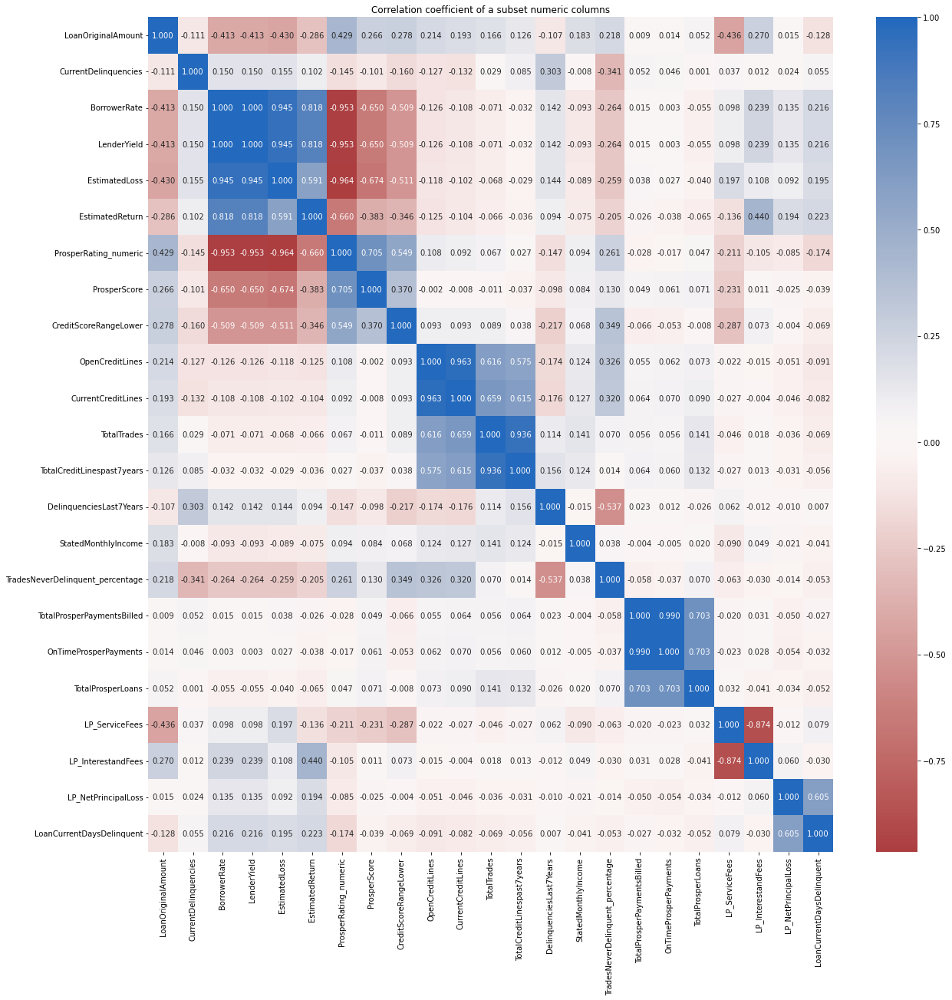

In [18]:
# heatmap of smaller set from property_072009 dataset
plt.figure(figsize=[20,20])
sb.heatmap(propertyLoan_072009[numeric_vars].corr(), annot=True, fmt='.3f',
          cmap='vlag_r', center=0);
plt.title("Correlation coefficient of a subset numeric columns");

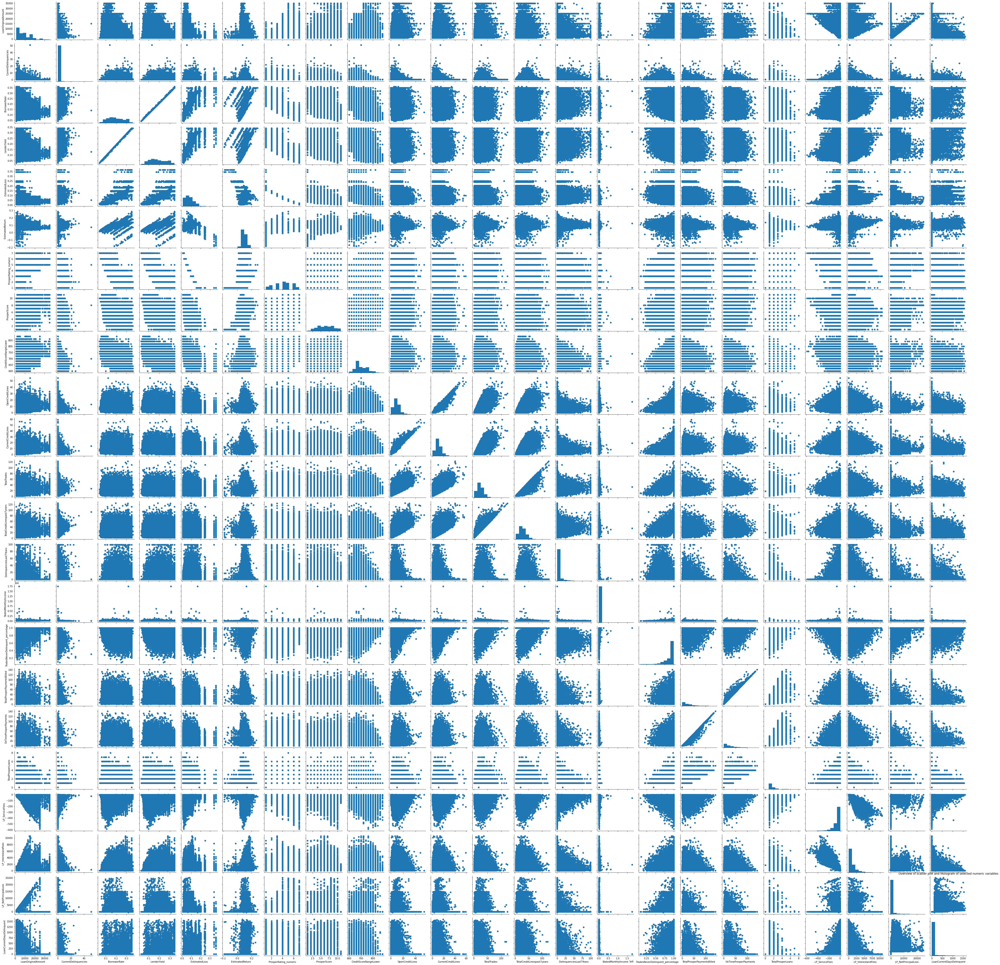

In [19]:
# overview of scatter plot and histogram of the selected subset of numeric variable in which some of the 
# variables can produce good correlations
g = sb.PairGrid(data=propertyLoan_072009[numeric_vars])
g.map_diag(plt.hist)
g.map_offdiag(plt.scatter);
plt.title("Overview of scatter plot and histogram of selected numeric variables");

## Univariate Exploration

> In this section, investigate distributions of individual variables. check for outliers


## First I explored numberic variable for their histogram

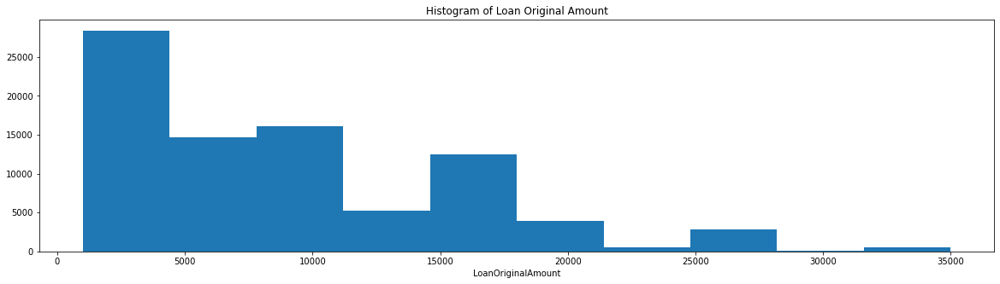

In [20]:
# I start with loan amount
plt.figure(figsize = [20, 5])
plt.hist(data=propertyLoan_072009, x='LoanOriginalAmount');
plt.xlabel("LoanOriginalAmount")
plt.title("Histogram of Loan Original Amount");

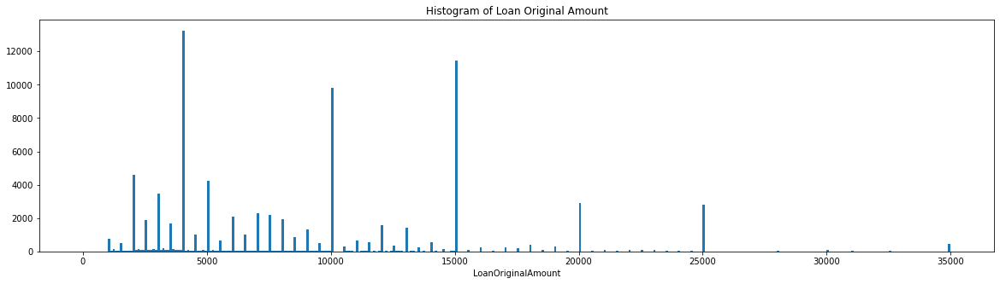

In [21]:
# loan amount with samller bin size
plt.figure(figsize = [20, 5])
binsize = propertyLoan_072009.LoanOriginalAmount.min()/10
bins = np.arange(0, propertyLoan_072009.LoanOriginalAmount.max()+binsize, binsize)
plt.hist(data=propertyLoan_072009, x='LoanOriginalAmount', bins=bins);
plt.xlabel("LoanOriginalAmount");
plt.title("Histogram of Loan Original Amount");

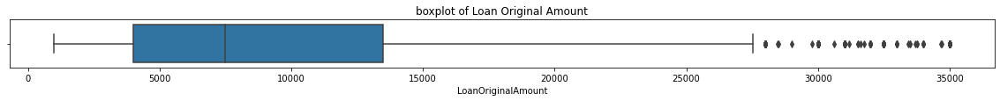

In [22]:
# box plot of loan amount
plt.figure(figsize = [20, 1])
sb.boxplot(x=propertyLoan_072009["LoanOriginalAmount"])
plt.xlabel("LoanOriginalAmount")
plt.title("boxplot of Loan Original Amount");

In [23]:
# lets check the log transformed of the LoanOriginalAmount
print(propertyLoan_072009.LoanOriginalAmount.describe())
print(np.log10(propertyLoan_072009.LoanOriginalAmount.describe()))

count    84853.000000
mean      9083.440515
std       6287.860058
min       1000.000000
25%       4000.000000
50%       7500.000000
75%      13500.000000
max      35000.000000
Name: LoanOriginalAmount, dtype: float64
count    4.928667
mean     3.958250
std      3.798503
min      3.000000
25%      3.602060
50%      3.875061
75%      4.130334
max      4.544068
Name: LoanOriginalAmount, dtype: float64


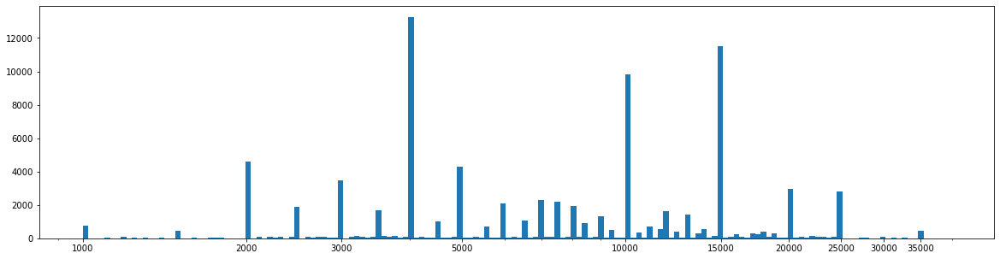

In [24]:
plt.figure(figsize = [20, 5])
bins = 10 ** np.arange(3, 4.6 + 0.01, 0.01)
ticks =[1000, 2000, 3000, 5000, 10000, 15000, 20000, 25000, 30000, 35000]
labels = ['{}'.format(v) for v in ticks]
plt.hist(data=propertyLoan_072009, x="LoanOriginalAmount", bins=bins)
plt.xscale('log');
plt.xticks(ticks, labels);

- Use a smaller bin size, we can see that the largest loan amount is \\$35,000, and the distribution of the loan amount does not follow normal distribution.  It is skewed towards the right side. Most of the loans are under \\$15,000 (included) which indicates those loans are small loans in nature.  There are lots outline on the higher loan amount end.  

- Log transformed histogram gives the similar pattern to that of regular scale with a much smaller bin.  It didn't provide additional insight. 

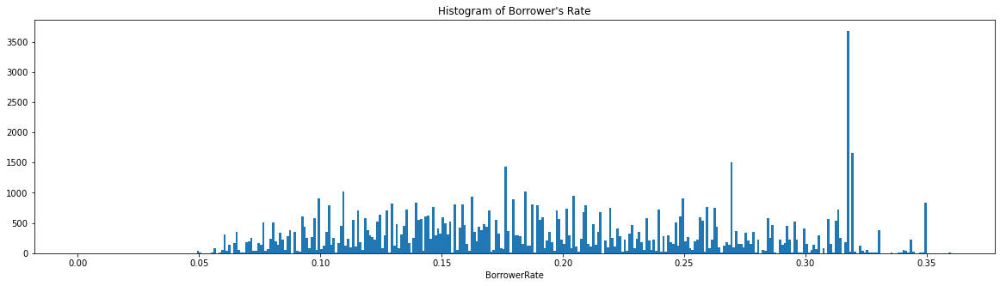

In [25]:
# Next look into BorrowRate
plt.figure(figsize = [20, 5])
binsize = propertyLoan_072009.BorrowerRate.min()/40
bins = np.arange(0, propertyLoan_072009.BorrowerRate.max()+binsize, binsize)
plt.hist(data=propertyLoan_072009, x='BorrowerRate', bins=bins);
plt.xlabel("BorrowerRate");
plt.title("Histogram of Borrower's Rate");

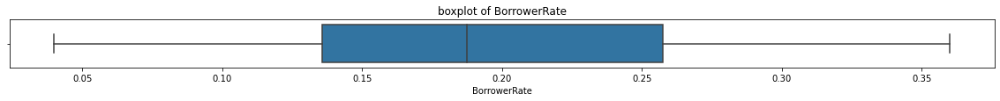

In [26]:
plt.figure(figsize = [20, 1])
sb.boxplot(x=propertyLoan_072009["BorrowerRate"])
plt.xlabel("BorrowerRate")
plt.title("boxplot of BorrowerRate");

The borrower's interest rates for all loans range from 0.04 to 0.36, and there is a spike at rate of 0.3177.  The distribution is NOT normal.  There are not lots of outlies.

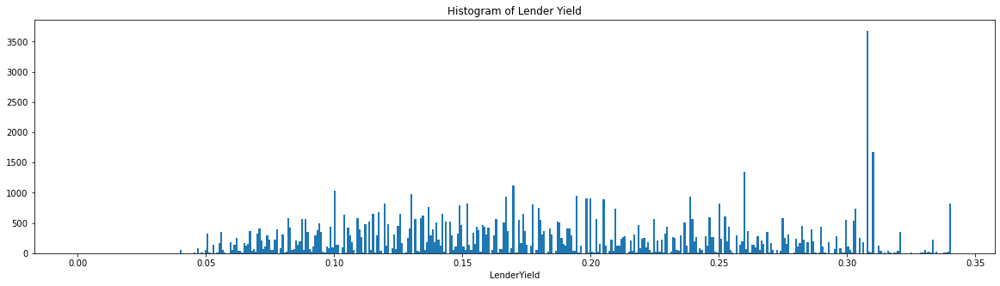

In [27]:
# next is LenderYield
plt.figure(figsize = [20, 5])
binsize = propertyLoan_072009.LenderYield.min()/40
bins = np.arange(0, propertyLoan_072009.LenderYield.max()+binsize, binsize)
plt.hist(data=propertyLoan_072009, x='LenderYield', bins=bins);
plt.xlabel("LenderYield");
plt.title("Histogram of Lender Yield");

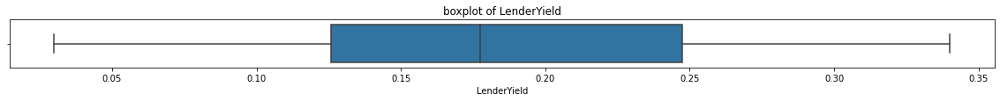

In [28]:
plt.figure(figsize = [20, 1])
sb.boxplot(x=propertyLoan_072009["LenderYield"])
plt.xlabel("LenderYield")
plt.title("boxplot of LenderYield");

The lender yield has very similar distribution pattern as Borrower's interest rate on the loan (Lender yield is equal to the interest rate on the loan less the servicing fee.  There are no outlier on both ends of the boxplot

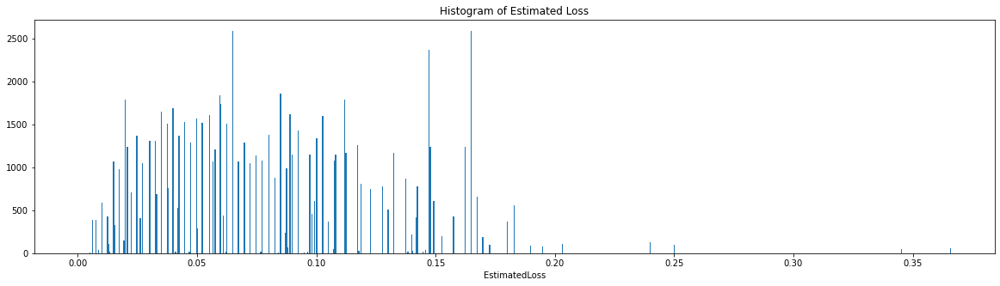

In [29]:
# Next is EsimatedLoss
plt.figure(figsize = [20, 5])
binsize = propertyLoan_072009.EstimatedLoss.min()/10
bins = np.arange(0, propertyLoan_072009.EstimatedLoss.max()+binsize, binsize)
plt.hist(data=propertyLoan_072009, x='EstimatedLoss', bins=bins);
plt.xlabel("EstimatedLoss");
plt.title("Histogram of Estimated Loss");

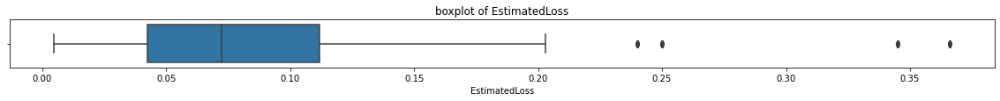

In [30]:
plt.figure(figsize = [20, 1])
sb.boxplot(x=propertyLoan_072009["EstimatedLoss"])
plt.xlabel("EstimatedLoss")
plt.title("boxplot of EstimatedLoss");

Estimated loss is the estimated principal loss on charge-offs. Applicable for loans originated after July 2009.  Most of the estimates principal loss is under 0.20.  There are some outliers on the high end.

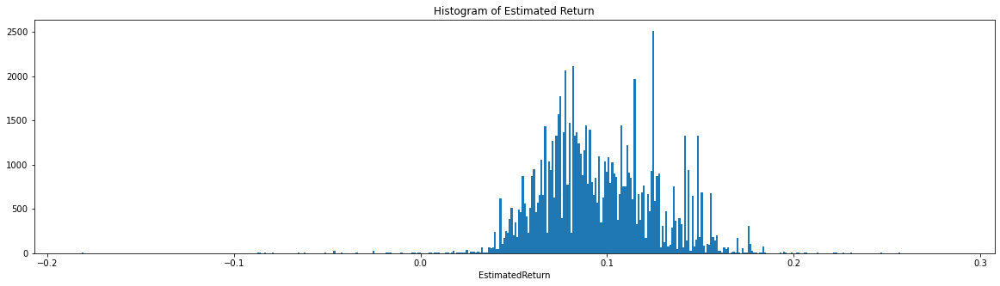

In [31]:
# EstimatedReturn
plt.figure(figsize = [20, 5])
binsize = 0.001
bins = np.arange(propertyLoan_072009.EstimatedReturn.min()-binsize, propertyLoan_072009.EstimatedReturn.max()+binsize, binsize)
plt.hist(data=propertyLoan_072009, x='EstimatedReturn', bins=bins);
plt.xlabel("EstimatedReturn");
plt.title("Histogram of Estimated Return");

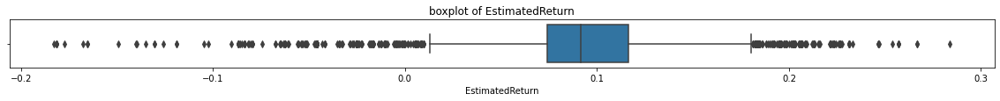

In [32]:
plt.figure(figsize = [20, 1])
sb.boxplot(x=propertyLoan_072009["EstimatedReturn"])
plt.xlabel("EstimatedReturn")
plt.title("boxplot of EstimatedReturn");

The majority of the EstimatedReturn are positive and between 0.02 to 0.18.  There are outliers on both direction of the boxplot.

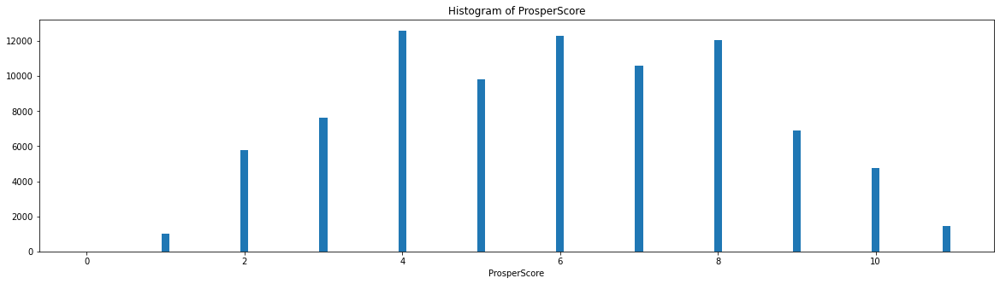

In [33]:
# Prosper Score
plt.figure(figsize = [20, 5])
binsize = 0.1
bins = np.arange(0, propertyLoan_072009.ProsperScore.max()+binsize, binsize)
plt.hist(data=propertyLoan_072009, x='ProsperScore', bins=bins, align='left');
plt.xlabel("ProsperScore");
plt.title("Histogram of ProsperScore");

ProsperScore seems to be more of numeric factor from the above plot.  It is close to a normal distribution from all the applicant

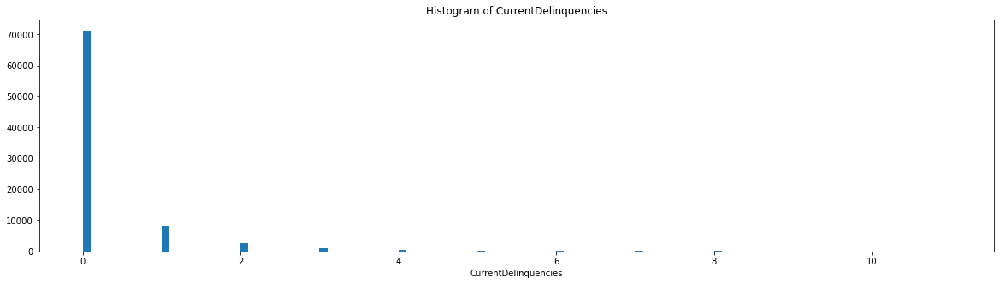

In [34]:
# CurrentDelinquencies
plt.figure(figsize = [20, 5])
binsize = 0.1
bins = np.arange(0, propertyLoan_072009.ProsperScore.max()+binsize, binsize)
plt.hist(data=propertyLoan_072009, x='CurrentDelinquencies', bins=bins);
plt.xlabel("CurrentDelinquencies");
plt.title("Histogram of CurrentDelinquencies");

CurrentDelinquencies also seems to be more of numeric factor since it has a value of 0, 1, 2, 3, 4 ... etc

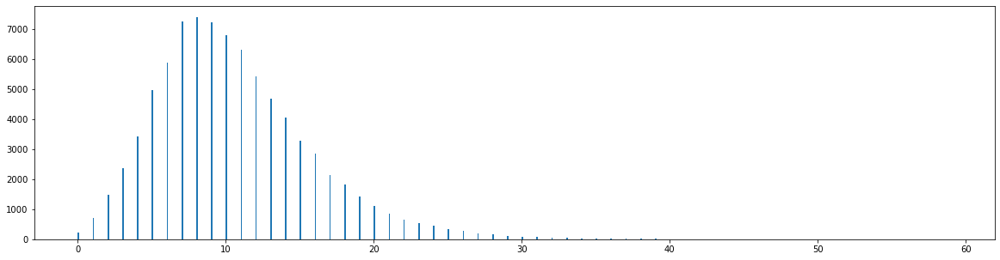

In [35]:
# CurrentCreditLines
plt.figure(figsize = [20, 5])
binsize = 0.1
bins = np.arange(0, propertyLoan_072009.CurrentCreditLines.max()+binsize, binsize)
plt.hist(data=propertyLoan_072009, x='CurrentCreditLines', bins=bins);

CurrentCreditLines is close to normal distribution and slightly skew to the right

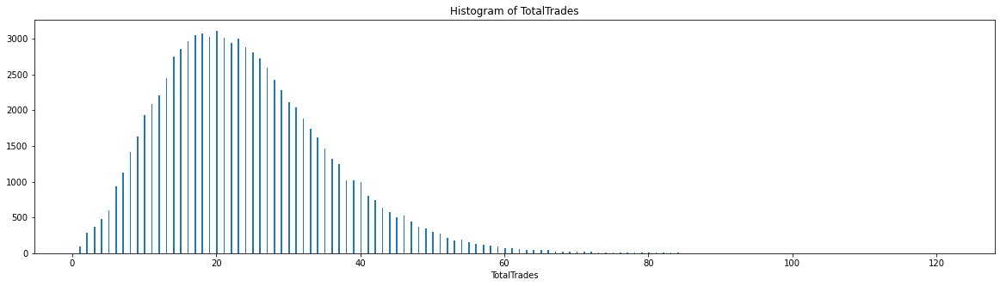

In [36]:
# TotalTrades
plt.figure(figsize = [20, 5])
binsize = propertyLoan_072009.TotalTrades.min()/5
bins = np.arange(propertyLoan_072009.TotalTrades.min()-binsize, propertyLoan_072009.TotalTrades.max()+binsize, binsize)
plt.hist(data=propertyLoan_072009, x='TotalTrades', bins=bins);
plt.xlabel("TotalTrades");
plt.title("Histogram of TotalTrades");

TotalTrades is similar to CurrentCreditLines in terms of distribution pattern

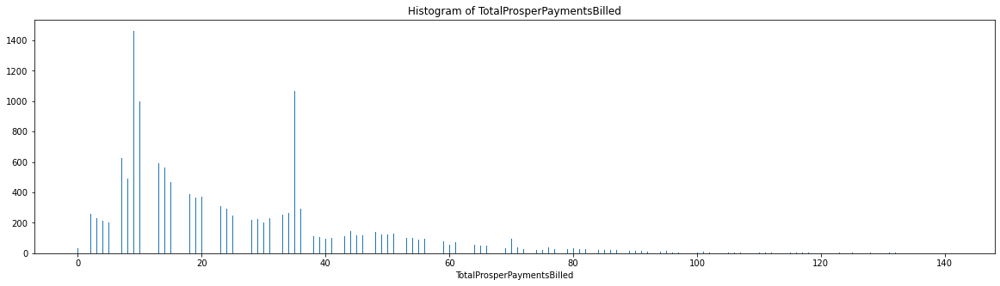

In [37]:
# TotalProsperPaymentsBilled
plt.figure(figsize = [20, 5])
binsize = 0.1
bins = np.arange(0, propertyLoan_072009.TotalProsperPaymentsBilled.max()+binsize, binsize)
plt.hist(data=propertyLoan_072009, x='TotalProsperPaymentsBilled', bins=bins);
plt.xlabel("TotalProsperPaymentsBilled");
plt.title("Histogram of TotalProsperPaymentsBilled");

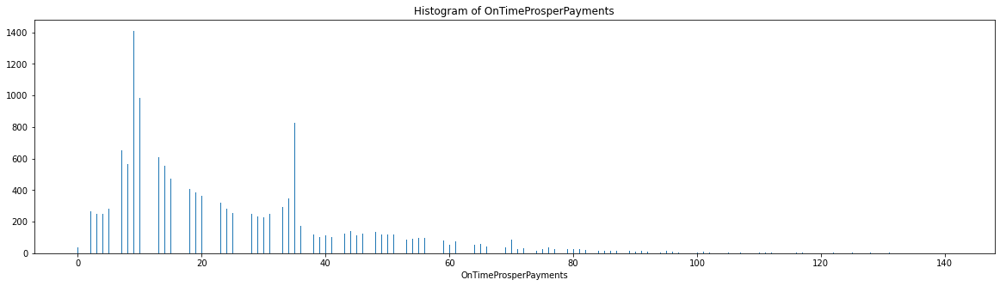

In [38]:
# OnTimeProsperPayments
plt.figure(figsize = [20, 5])
binsize = 0.1
bins = np.arange(0, propertyLoan_072009.OnTimeProsperPayments.max()+binsize, binsize)
plt.hist(data=propertyLoan_072009, x='OnTimeProsperPayments', bins=bins);
plt.xlabel("OnTimeProsperPayments");
plt.title("Histogram of OnTimeProsperPayments");

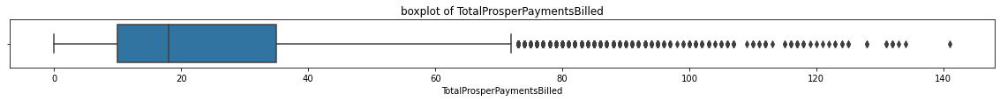

In [39]:
# TotalProsperPaymentsBilled
plt.figure(figsize = [20, 1])
sb.boxplot(x=propertyLoan_072009["TotalProsperPaymentsBilled"])
plt.xlabel("TotalProsperPaymentsBilled")
plt.title("boxplot of TotalProsperPaymentsBilled");

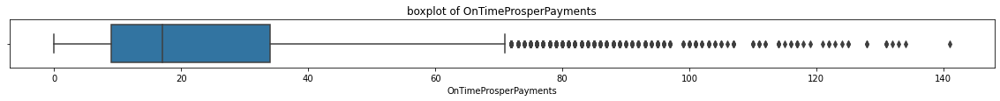

In [40]:
# OnTimeProsperPayments
plt.figure(figsize = [20, 1])
sb.boxplot(x=propertyLoan_072009["OnTimeProsperPayments"])
plt.xlabel("OnTimeProsperPayments")
plt.title("boxplot of OnTimeProsperPayments");

Both TotalProsperPaymentsBilled and OnTimeProsperPayments have the similar distribution pattern, and are not normal distribution. The outliers are on the higher end rather than low end.

## Second, we will evaluate categorical factors through count plot

In [41]:
def plot_countplot_percentage(df, column):
    """
    This function pass the dataframe and one of its column either categorical type, int64 type, or boolean type 
    Then calculate percentage of each bar out of the entire counts
    
    Args:
        (dataframe) df - property dataframe
        (string) column name - NON nummeric columns (category, int64, or boolean type) 
    
    Returns:
        percentage being printed on the top of each bar, in decending order
    """
    plt.figure(figsize = [20, 5])
    base_color = sb.color_palette()[0]
    total = df[column].value_counts().sum()
    column_type_counts = df[column].value_counts()
    
    if df[column].dtype == 'int64':
        column_type_order = column_type_counts.index
        sb.countplot(data=df, y=column, color=base_color, order=column_type_order);
        
        j=0
        for i in column_type_order:
            count = column_type_counts[i]
            #convert count into a percentage, and then into string
            pct_string = '{:0.1f}%'.format(100*count/total)
            #print("i, count, pct_string {} {} {}".format(i, count, pct_string ) )
            # Print the string value on the bar.
            plt.text(count, j , pct_string, va='center')
            plt.title("Bar Chart of {}".format(column))
            j=j+1
    else:
        if df[column].dtype == 'category':
            column_type_order = column_type_counts.index
            sb.countplot(data=df, y=column, color=base_color, order=column_type_order);
        else:  # boolean type
            sb.countplot(data=df, y=column, color=base_color);
    
        for i in range (column_type_counts.shape[0]):
            count = column_type_counts[i]
            #convert count into a percentage, and then into string
            pct_string = '{:0.1f}%'.format(100*count/total)
            # Print the string value on the bar.
            plt.text(count+1, i, pct_string, va='center')
            plt.title("Bar Chart of {}".format(column))

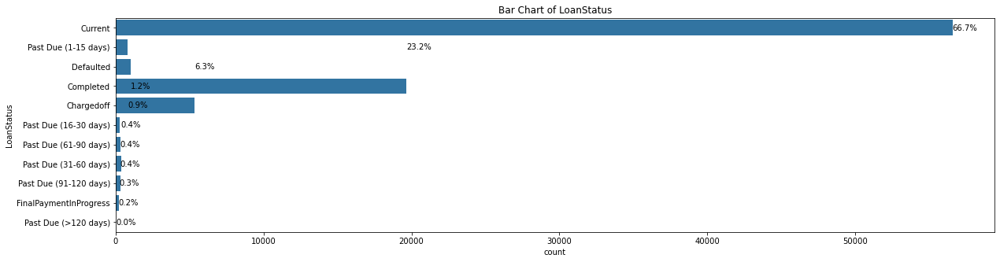

In [42]:
# plot loan status
plot_countplot_percentage(propertyLoan_072009, "LoanStatus")

For loan status, the majority of the loans are either current (\~67%) or completed (\~23%).  There is a big chuck of the Chargedoff (\~6.3%) and Defaulted (\~1.2%).  The remaining status are pass due from 1 day to >120 day.  We will look into other factors vs loan status in bi- or multi- variate exploration

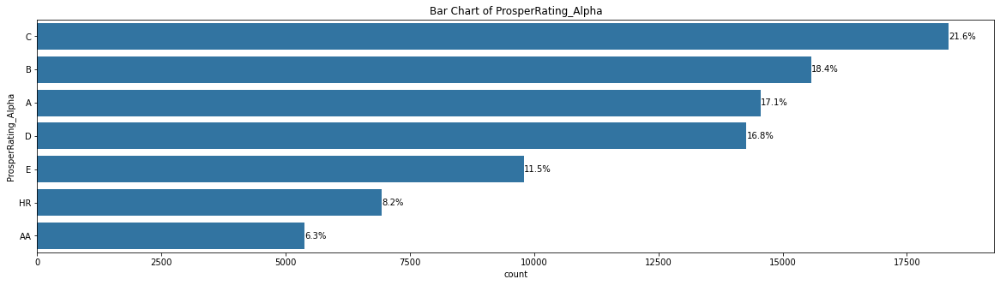

In [43]:
# plot ProsperRating_Alpha
plot_countplot_percentage(propertyLoan_072009, "ProsperRating_Alpha")

For majority of the loan applicants, most of them hav rating of A, B, C, D by Prosper.  We will look later if we can use Prosper rating to predict Chargedoff and defaulted loan

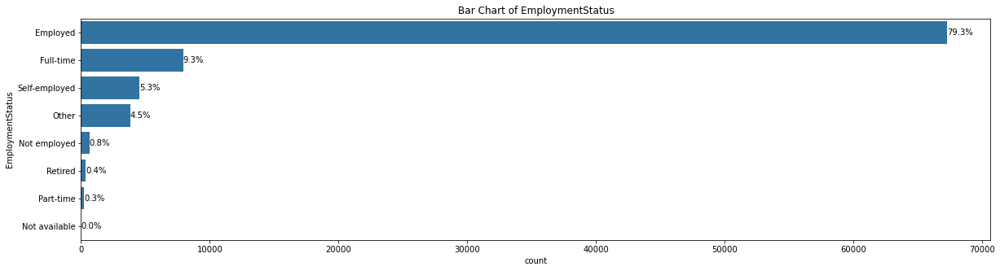

In [44]:
# plot employment status
plot_countplot_percentage(propertyLoan_072009, "EmploymentStatus")

Most of the applicants are employed (\~79%), Full-time (\~9%), or Self-employed (\~5%).  We will check how employment status can be used to predict chargedoff and defaulted loan

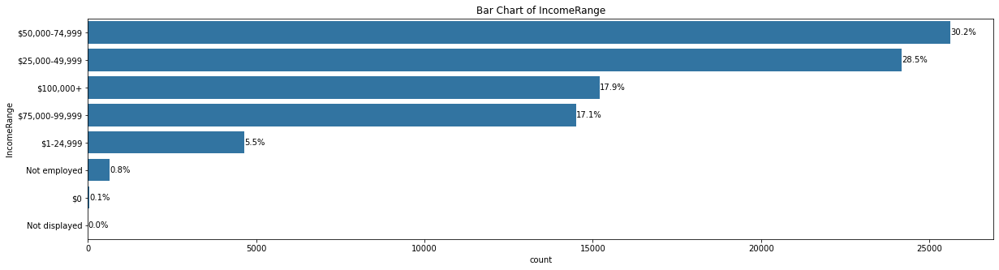

In [45]:
# plot IncomeRange
plot_countplot_percentage(propertyLoan_072009, "IncomeRange")

The income range for most of the applicants are from \\$25,000 to \\$99,999.  We will check whether this factor affects the defaulted or changedoff loan

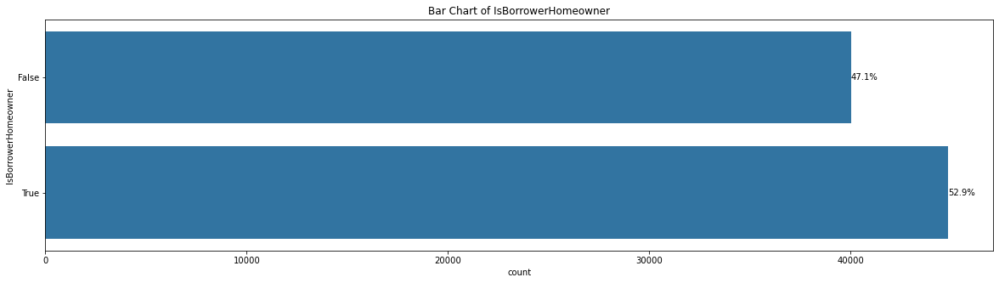

In [46]:
# plot IsBorrowerHomeowner
plot_countplot_percentage(propertyLoan_072009, "IsBorrowerHomeowner")

There are slightly more homeowners than renters who applied Prosper Loan

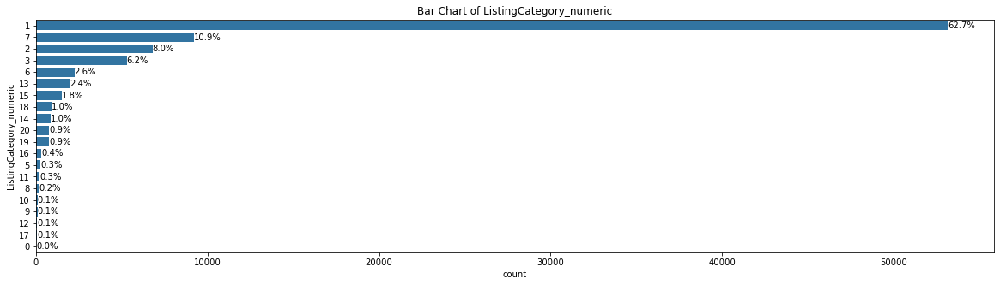

In [47]:
#ListingCategories
# The category of the listing that the borrower selected when posting their listing: 
# 0 - Not Available, 1 - Debt Consolidation, 2 - Home Improvement, 3 - Business, 4 - Personal Loan, 
# 5 - Student Use, 6 - Auto, 7- Other, 8 - Baby&Adoption, 9 - Boat, 
# 10 - Cosmetic Procedure, 11 - Engagement Ring, 12 - Green Loans, 13 - Household Expenses, 14 - Large Purchases, 
# 15 - Medical/Dental, 16 - Motorcycle, 17 - RV, 18 - Taxes, 19 - Vacation, 20 - Wedding Loans
plot_countplot_percentage(propertyLoan_072009, "ListingCategory_numeric")

For the purpose of the loan, majority of the applicants (\~63%) use the loan for Debt Consolidation.  Next catgory is other (\~11%), followed by home improvement (\~8%) and for business (\~6%).  We will find out which category will have the most chargedoff and default loan

### Discuss the distribution(s) of your variable(s) of interest. Were there any unusual points? Did you need to perform any transformations?

> The distribution of the variables are under each graph.  There are outliers for certain varibles (e.g. LoanOriginalAmount, EstimatedLoss, EstimatedReturn, TotalProsperPaymentsBilled, OnTimeProsperPayments, etc.  I did perform log transformation for  LoanOriginalAmount.  However, transformation don't provide any additional information.

### Of the features you investigated, were there any unusual distributions? Did you perform any operations on the data to tidy, adjust, or change the form of the data? If so, why did you do this?

> I performed operations on the data to tidy and adjust.  This is because the dataset clearly can be seperated into two different timeframe: pre-072009 and after-072009 for easy study.   I also deleted some columns that are not related to aggregated result as described earlier

## Bivariate Exploration

> In this section, investigate relationships between pairs of variables in your
data. 

## From the heatmap of Correlation coefficient of a subset numeric columns, there is no quick way of telling that a particular numeric value can be associated with loan defaulted/chargedoff status.  The countplot of the categorical factor didn't reveal any information either.  I followed the steps described below to explore bivariate relationship
> **Step 1: Investigate boxplot of category factor vs numeric factors**  

> **Step 2: Explore barplot of loan status vs other category factors to see the relationship**

### Step1: explore boxplot of category factor vs numeric factors

<Figure size 1080x1080 with 0 Axes>

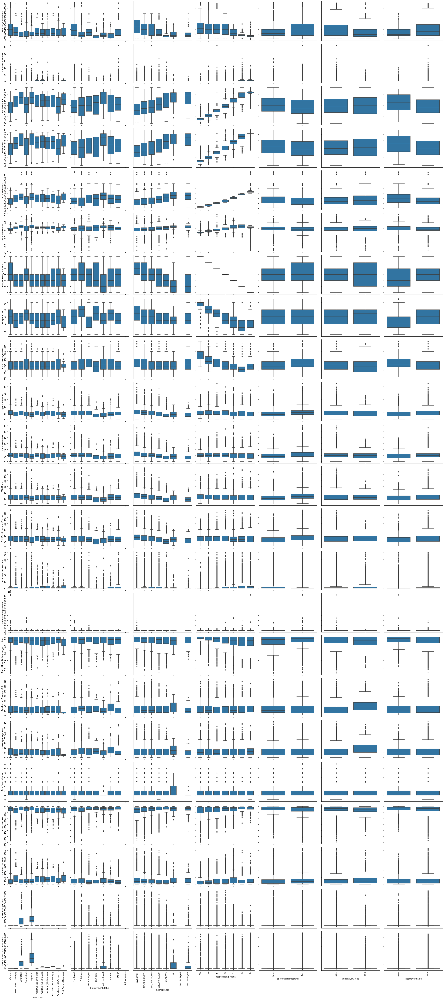

In [48]:
# reference: https://splunktool.com/how-to-rotate-labels-in-a-seaborn-pairgrid
# plot matrix of numeric features against categorical features.
# can use a larger sample since there are fewer plots and they're simpler in nature.
def boxgrid(x, y, **kwargs):
    """ Quick hack for creating box plots with seaborn's PairGrid. """
    default_color = sb.color_palette()[0]
    sb.boxplot(x=x, y=y, color=default_color)
    
plt.figure(figsize = [15, 15])
g = sb.PairGrid(data=propertyLoan_072009, y_vars=numeric_vars, x_vars=categoric_vars,
               height=3, aspect=1.5)
g.map(boxgrid)
for ax in g.axes.flatten():
   ax.tick_params(rotation = 90)

From the above boxplot of LoanStatus vs other numeric variable, we can see for Chargedoff and Defaulted loans, the medium loan originated amount for the Defaulted loan is on the lower side, while that of Chargedoff loan is much higher.  Medium Borrower Rate for Chargedoff and Defaulted loan are relative higher than other loans in good standing.  Medium ProsperScore are the lowest for Chargedoff loans when compared to others loans.  Other boxplots didn't reveal too much information.

## Step 2: Explore barplot of loan status vs other category factors to see the relationship

In [49]:
def create_df_barchat(df, column1, column2):
    """
    - This function pass the property loan df and two of its category columns, and the one being 'LoanStatus' 
    - It will calculate the count and percentage of loan status based on the first category sub factor 
    
    Args:
        (dataframe) df - property dataframe
        (string) column1 name - the first category column
        (string) column2 name - the second category column
    Returns:
        (dataframe) new_df - return a df that only two categories with abosulte counts and relative percentage
        
        For example:
        EmploymentStatus	LoanStatus	count	percent
            0	Employed	Completed	12320	18.303372
            1	Employed	Current	48929	72.692022
            2	Employed	Past Due (1-15 days)	675	1.002823
            3	Employed	Past Due (16-30 days)	226	0.335760
            4	Employed	Past Due (31-60 days)	293	0.435299
            ...	...	...	...	...
            91	Not available	Past Due (>120 days)	0	NaN
            92	Not available	Chargedoff	0	NaN
            93	Not available	Defaulted	0	NaN
            94	Not available	FinalPaymentInProgress	0	NaN
            95	Not available	Cancelled	0	NaN
    """
    new_df  = df.groupby([column1, column2]).size().reset_index(name='count')
    percent = df.groupby([column1, column2]).size().groupby(level=0).apply(lambda x: 100 * x / float(x.sum())).values
    new_df['percentage'] = percent
    
    return new_df

In [50]:
# EmploymentStatus vs Loanstatus
df_EmploymentStatus_Loanstatus_count = create_df_barchat(propertyLoan_072009, "EmploymentStatus","LoanStatus")

In [51]:
df_EmploymentStatus_Loanstatus_count

,EmploymentStatus,LoanStatus,count,percentage
0,Employed,Chargedoff,3529,5.242906
1,Employed,Completed,12320,18.303372
2,Employed,Current,48929,72.692022
3,Employed,Defaulted,630,0.935968
4,Employed,FinalPaymentInProgress,177,0.262962
...,...,...,...,...
83,Not available,Past Due (16-30 days),0,NaN
84,Not available,Past Due (31-60 days),0,NaN
85,Not available,Past Due (61-90 days),0,NaN
86,Not available,Past Due (91-120 days),0,NaN


In [52]:
fig = px.bar(df_EmploymentStatus_Loanstatus_count, x='EmploymentStatus', y='count', color='LoanStatus', text_auto=True)
fig.update_layout(title_text='EmploymentStatus vs Loanstatus - by counts')
fig.show()

In [53]:
fig = px.bar(df_EmploymentStatus_Loanstatus_count, x='EmploymentStatus', y='percentage', color='LoanStatus', text_auto=True)
fig.update_layout(title_text='EmploymentStatus vs Loanstatus - by percentage')
fig.show()

In [54]:
# IncomeRange vs LoanStatus
df_IncomeStatus_Loanstatus_count = create_df_barchat(propertyLoan_072009, "IncomeRange", "LoanStatus")
df_IncomeStatus_Loanstatus_count

,IncomeRange,LoanStatus,count,percentage
0,"$100,000+",Chargedoff,520,3.419928
1,"$100,000+",Completed,3341,21.973035
2,"$100,000+",Current,10916,71.792174
3,"$100,000+",Defaulted,71,0.466952
4,"$100,000+",FinalPaymentInProgress,52,0.341993
...,...,...,...,...
83,Not employed,Past Due (16-30 days),5,0.770416
84,Not employed,Past Due (31-60 days),3,0.462250
85,Not employed,Past Due (61-90 days),6,0.924499
86,Not employed,Past Due (91-120 days),3,0.462250


In [55]:
fig = px.bar(df_IncomeStatus_Loanstatus_count, x='IncomeRange', y='percentage', color='LoanStatus', text_auto=True)
fig.update_layout(title_text='IncomeRange vs Loanstatus - by percentage')
fig.show()

Two groups of IncomeRange have the hightest Chargedoff and default loans:  \\$0 and Not employed (26.6% and 25.1% respectively).  While IncomeRange > \$100,000+ has the lowest chargedoff and defaulted loans (total 3.8%). This match the result from EmploymentStatus vs LoanStatus stacked barplots

In [56]:
# ProsperRating_Alpha vs LoanStatus
df_ProsperRating_Loanstatus_count = create_df_barchat(propertyLoan_072009, "ProsperRating_Alpha", "LoanStatus")
fig = px.bar(df_ProsperRating_Loanstatus_count, x='ProsperRating_Alpha', y='percentage', color='LoanStatus', text_auto=True)
fig.update_layout(title_text='ProsperRating_Alpha vs Loanstatus - by percentage')
fig.show()

For ProperRating_Alpha, it is obvious that decrease in rating from AA to HR, the chargedoff+defaulted rate increases.  Loan applicants with D, E, HR rating tends to have > 10% of the chargedoff and defaulted rate.  HR has total of 20.5% of the chargedoff and defaulted rate altogether

In [57]:
# ListingCategory vs LoanStatus
# The category of the listing that the borrower selected when posting their listing: 
# 0 - Not Available, 1 - Debt Consolidation, 2 - Home Improvement, 3 - Business, 4 - Personal Loan, 
# 5 - Student Use, 6 - Auto, 7- Other, 8 - Baby&Adoption, 9 - Boat, 
# 10 - Cosmetic Procedure, 11 - Engagement Ring, 12 - Green Loans, 13 - Household Expenses, 14 - Large Purchases, 
# 15 - Medical/Dental, 16 - Motorcycle, 17 - RV, 18 - Taxes, 19 - Vacation, 20 - Wedding Loans
df_ListingCategory_LoanStatus_count = create_df_barchat(propertyLoan_072009, "ListingCategory_numeric", "LoanStatus")
fig = px.bar(df_ListingCategory_LoanStatus_count, x='ListingCategory_numeric', y='percentage', color='LoanStatus', text_auto=True)
fig.update_layout(title_text='ListingCategory vs Loanstatus - by percentage')
fig.show()

For ListingCategory, category 5 (Student Use), 12 (Green Loan), 3 (business), 7 (other), 6 (auto) shows relatively high percentage Chargedoff and defaulted loans.  While category 17 (RV) shows the lowest percentage Chargedoff and defaulted loans.  There is no record for category 4 (personal loan) for the after-072009 data set

In [58]:
# CreditScoreRangeLower vs LoanStatus
df_CreditScoreRangeLower_LoanStatus_count = create_df_barchat(propertyLoan_072009, "CreditScoreRangeLower", "LoanStatus")
fig = px.bar(df_CreditScoreRangeLower_LoanStatus_count, x='CreditScoreRangeLower', y='percentage', color='LoanStatus', text_auto=True)
fig.update_layout(title_text='CreditScoreRangeLower vs Loanstatus - by percentage')
fig.show()

As you can see from above barchart, when credit score decreases, percentage of chargedoff and defaulted loan increase. There is a sudden jump of the these loans at credit score at 620.   20% of the applicants with credit score 620 either have defaulted and chargedoff loan.  21% of the applicants with credit score 600 either default and chargedoff

In [59]:
# Homeowner vs LoanStatus
df_Homeowner_Loanstatus_count = create_df_barchat(propertyLoan_072009, "IsBorrowerHomeowner", "LoanStatus")
fig = px.bar(df_Homeowner_Loanstatus_count, x='IsBorrowerHomeowner', y='percentage', color='LoanStatus', text_auto=True)
fig.update_layout(title_text='IsBorrowerHomeowner vs Loanstatus - by percentage')
fig.show()

The above barchart indicated that non-homeowner has slightly more chance to be defaulted+chargedoff when compare to homeowners

In [60]:
# BorrowerState vs LoanStatus
df_state_loanstatus_count = create_df_barchat(propertyLoan_072009, "BorrowerState", "LoanStatus")
fig = px.bar(df_state_loanstatus_count, x='BorrowerState', y='percentage', color='LoanStatus', text_auto=True)
fig.update_layout(title_text='BorrowerState vs Loanstatus - by percentage')
fig.show()

Borrower's home location (State) clearly has some impact on percentage of chargedoff and defaulted loan.  SD has the highest  while MT has the lowest percentage in terms of chargedoff and defaulted loans

In [61]:
# LoanOriginationYear vs LoanStatus
df_year_LoanStatus_count = create_df_barchat(propertyLoan_072009, "LoanOriginationYear", "LoanStatus")
fig = px.bar(df_year_LoanStatus_count, x='LoanOriginationYear', y='percentage', color='LoanStatus', text_auto=True)
fig.update_layout(title_text='LoanOriginationYear vs Loanstatus - by percentage')
fig.show()

In [62]:
fig = px.bar(df_year_LoanStatus_count, x='LoanOriginationYear', y='count', color='LoanStatus', text_auto=True)
fig.update_layout(title_text='LoanOriginationYear vs Loanstatus - by count')
fig.show()

It is interesting to see that year 2013 and 2014, there is either low or no loan in chargedoff and defaulted status.  This could be explained by the good economy in 2013 and 2014.  Both 2013 and 2014 the chargedoff and defaulted loan rate are very low.  
Please read the following reference    
- https://obamawhitehouse.archives.gov/blog/2013/12/19/economy-2013#slides           
- https://obamawhitehouse.archives.gov/blog/2014/12/16/economy-2014

In [63]:
# EmploymentStatus vs LoanOriginationYear
df_EmploymentStatus_LoanOriginationYear_count = create_df_barchat(propertyLoan_072009, "LoanOriginationYear", "EmploymentStatus")
fig = px.bar(df_EmploymentStatus_LoanOriginationYear_count, x='LoanOriginationYear', y='percentage', color='EmploymentStatus', text_auto=True)
fig.update_layout(title_text='EmploymentStatus vs LoanOriginationYear - by percentage')
fig.show()

From the barchart of EmploymentStatus vs EmploymentStatus, we can see year 2013 and 2014 has low unemployment rate (0.24% and 0%)

In [64]:
# Occupation vs LoanStatus
df_EmploymentStatus_LoanOriginationYear_count = create_df_barchat(propertyLoan_072009, "Occupation", "LoanStatus")
fig = px.bar(df_EmploymentStatus_LoanOriginationYear_count, x='Occupation', y='percentage', color='LoanStatus', text_auto=True,
             height = 600)
fig.update_layout(title_text='Occupation vs LoanStatus - by percentage')
fig.show()

It is very interesing to see that college sophomo, Freshman, and junior students have the top three highest proportion to be either get their loans into chargedoff and defaulted status.  College students belong to no employment group. 

### Talk about some of the relationships you observed in this part of the investigation. How did the feature(s) of interest vary with other features in the dataset?

> LoanStatus are affected by economic condition of the year, EmploymentStatus, IncomeRange, Occupation, ProsperRating_Alpha, CreditScoreRangeLower, ListingCategory_numeric etc.  The details of LoanStatus vs other category factor were described under each graph

### Did you observe any interesting relationships between the other features (not the main feature(s) of interest)?

> I observed the fact that if the economic condition improved, more people will be employed, and hence it will more likely to keep the loan current or pay off loan on time.  Therefore it is less likely to get into either defaulted or chargedoff status

## Multivariate Exploration

> Create plots of three or more variables to investigate my data even
further. 

In [65]:
# LoanStatus, LoanOrignalAmount, EmploymentStatus, year 
fig = px.strip(propertyLoan_072009, x="LoanOriginalAmount", y='EmploymentStatus', color='LoanStatus', 
              facet_row='LoanOriginationYear', height=1200)
fig.update_layout(title_text='LoanOrignalAmount vs EmploymentStatus, LoanStatus in different years')
fig.show()

From the above strip graph, we can see there is no applicants in the chargedoff and defauted loan status in year 2014.  Other information needs to be plotted in a three categorical factors only

Lastly, I will explore three categorical factor relation

In [66]:
# function to plot three categorical factors
def plot_three_category_factors(df, column1, column2, column3):
    """
    - This function pass the property loan df and three of its category columns, and stacked bar plots are grouped by factors in column1
    - This function uses calls another function defined earlier: def create_df_barchat(df, column1, column2)
    
    Args:
        (dataframe) df - property dataframe
        (string) column1 name - the first category column
        (string) column2 name - the second category column
        (string) column3 name - the third category column
    Returns:
        barplots show relationship of three category factors
    """    
    for i in range(df[column1].value_counts().index.size):
        col_index = df[column1].value_counts().index[i]
        #print(col_index)
        df2 = df.query("{} == '{}'".format(column1, col_index))
        df_counts = create_df_barchat(df2, column2, column3)
        fig = px.bar(df_counts, x=column2, y='percentage', color=column3, text_auto=True, height = 600)
        fig.update_layout(title_text='{}:{} - {} vs {} - by percentage'.format(column1, col_index, column2, column3))
        fig.show()

In [67]:
# plot relationship of IncomeRange, Occupation, and LoanStatus
plot_three_category_factors(propertyLoan_072009, "EmploymentStatus", "IncomeRange", "LoanStatus")

We can see from the EmploymentStatus, IncomeRange, LoanStatus plots
- 1) For EmploymentStatus = employed loan borrowers, the lower the income, the higher the total percentage of loan in chargedoff and defaulted status

- 2) For EmploymentStatus = Full-time loan borrowers, income range from \\$1-24,999 has the highest total percentage of loan in chargedoff and defaulted status

- 3) For EmploymentStatus = Self-employed, the lower the income, the higher the total percentage of loan in chargedoff and defaulted status

- 4) For EmploymentStatus = Other, income range from $1-24,000 has the highest total percentage of loan in chargedoff and defaulted status

- 5) For EmploymentStatus = Not employed, only one group income range has the total percentage of loan in chargedoff and defaulted status

- 6) For EmploymentStatus = Retired,  income range from $75,000-99,999 has the highest total percentage of loan in chargedoff and defaulted status

- 7) For EmploymentStatus = Part-time, only three income range data is avaiable.  The highest the income, the highest total percentage of loan in chargedoff and defaulted status

- 8) For EmploymentStatus = Not Avaible, there is NO data


In [75]:
# Finally, CreditScore vs LoanStatus and ProsperRating_Alpha
df = propertyLoan_072009.query("LoanStatus == 'Chargedoff' or LoanStatus =='Defaulted'")
plot_three_category_factors(df, "LoanStatus", "EmploymentStatus", "ProsperRating_Alpha")

From the above barplots, it indicates that regardless of EmploymentStatus, the percentage(>80%) of the people who gets their loan into Chargedoff/Defaulted status are having a C or lower ProsperRating_Alpha 

### Talk about some of the relationships you observed in this part of the investigation. Were there features that strengthened each other in terms of looking at your feature(s) of interest?

> Upon plotting strip graph using LoanStatus, LoanOrignalAmount, EmploymentStatus, year, it didn't reveal extra information other than in year 2014, when the economy was doing well, the percentage of loan got into chargedoff and defaulted status is none.

> barplot of EmploymentStatus, IncomeRange, and LoanStatus barplots indicated that the more income a loan applicant has (except for retired and part-time applicant, it is less likely to be in defaulted and chargedoff status

> People having lower credit score or ProsperRating_Alpha letter (C, D, E, HR) tends to have Chargedoff/Defaulted loan status regardless of their EmploymentStatus.

### Were there any interesting or surprising interactions between features?

> The surprising part of the Employment and IncomeRange relationship is for the group of part-time and retired applicant.  Higher income doesn't necessary tranlate to lower percentage of defaulted and chargedoff status

## Conclusions
>There are many factors that will affect loan in defaulted and chargedoff status: credit score, employment status, income range, etc.   The economic condition is directly affecting people's pocket and hence employment.   Overall, people with good credit, has employment with higher pay tends to be less likely to get into defaulted and chargedoff status in their loan.  College students seems most likely to be in defaulted and chargedoff status for the prosper loans the borrowed.
